## Visual Search

The objective is the development of a method that, given a pair of images allows to decide if they belong to the same category or not, or given a query image, allows finding the k most similar images in a set of reference samples.

## Imports and functions

In this section we make all necessary imports to execute the code. Also we define the functions that we will use in the different tests.

In [1]:
import torch

if torch.cuda.is_available():
    device_name = "cuda"
elif torch.backends.mps.is_available():
    device_name = "mps"
else:
    device_name = "cpu"
    
device = torch.device(device_name)
print(f"Code runs in {device}")

Code runs in cpu


In [2]:
import argparse
import numpy as np
from matplotlib import pyplot as plt
from torchvision import datasets
import torchvision.transforms as transforms

import torch
import torchvision.models as models
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
import torch.nn as nn

from PIL import Image

import pytorch_metric_learning.losses as losses
import pytorch_metric_learning.distances as distances
import pytorch_metric_learning.miners as miners
import pytorch_metric_learning.utils.accuracy_calculator as accuracy_calculator
import torch.nn.functional as F

from pytorch_metric_learning.utils import common_functions as c_f

In [3]:
# Constants with the path, batch size and the number of classes in the dataset
dataPath = 'dataset'
num_classes = 24
batch_size = 64

In [4]:
# Auxiliary class to store the class identifier and embedding object
class Classification_emb:
    def __init__(self, emb, classif):
        self.emb = emb
        self.classification = classif

In [5]:
# Auxiliary class to store the class identifier and the distance to the reference image
class Classification:
    def __init__(self, classif, dist):
        self.classification = classif
        self.distance = dist

In [6]:
# Auxiliary class to store the class identifier and the distance to the query images
class Classification_queried:
    def __init__(self, obj, classif, dist):
        self.obj = obj
        self.classification = classif
        self.distance = dist

In [7]:
# Show sample images (code given)
def show_samples(dataset):
    # Get all the indexes for each label
    labels_to_indices = c_f.get_labels_to_indices(dataset.targets)
    indexes = [labels_to_indices[i] for i in np.arange(0,24)]

    cols, rows = 8, 3
    # Set the size of the plot
    figure = plt.figure(figsize=(cols*2, rows*2))

    # for each class (24 classes)
    for i in range(0, cols * rows):
        # Get the first image of each class
        sample, label = dataset[indexes[i][0]]
        figure.add_subplot(rows, cols, i+1)
        plt.title(f'Class {dataset.classes[label]}')
        plt.axis("off")
        plt.imshow(sample.permute(1, 2, 0), cmap="gray")
    plt.show()

In [8]:
# Get the image that we are going to use as reference and also plot it.
# We select the first image available in the dataset, representing a flower of class 1
def get_and_plot_query_image():
    # Load query image
    query_img = Image.open(f'{dataPath}/test/001/image_06742.jpg')

    plt.imshow(query_img)
    plt.title("Query image - Class 001")
    plt.xticks([])
    plt.yticks([])
    plt.show

    return query_img

In [9]:
# Get the query images that we are going to use to search later
# We selected 5 images of classes 2, 5, 8, 10 and 17
def get_query_images():
    images = []
    # Load query image
    images.append(('2',Image.open(f'{dataPath}/test/002/image_05142.jpg')))
    images.append(('5',Image.open(f'{dataPath}/test/005/image_05156.jpg')))
    images.append(('8',Image.open(f'{dataPath}/test/008/image_03338.jpg')))
    images.append(('10',Image.open(f'{dataPath}/test/010/image_07109.jpg')))
    images.append(('17',Image.open(f'{dataPath}/test/017/image_03859.jpg')))
    
    return images

In [10]:
# Get the embeddings of the images from the set to use as a reference set
def get_reference_set(model, valid_loader):
    results = []

    # Specify to the model that we are going to evaluate
    model.eval()

    # Iterate for all the batches
    for i, (inputs, targets) in enumerate(valid_loader):
        inputs, targets = inputs.to(device), targets.to(device)

        for x in range(len(inputs)):
            # Add a batch dimension to the tensors
            query_tensor = torch.unsqueeze(inputs[x], 0)

            # Extract features from images using the ResNet model
            output = model(query_tensor)

            # Flatten embeddings into a 2D tensor
            query_k_fl = F.normalize(output.view(1, -1))

            results.append(Classification_emb(query_k_fl, targets[x]))
        
    return results

In [11]:
# Get two images to compare them and also plot them for same and distinct test
def get_and_plot_comparison_images(path1, path2, title):
    # Load images
    img_1 = Image.open(path1)
    img_2 = Image.open(path2)

    # Create the plot
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
    fig.suptitle(title)

    axes[0].imshow(img_1)
    axes[1].imshow(img_2)
        
    # Show the plot
    plt.suptitle = title
    plt.tight_layout()
    plt.show()

    return img_1, img_2

In [12]:
# Function to obtain the embedding of an image
def get_emb(img, model, transform):
    # Apply transformation to images
    query_tensor = transform(img)

    # Add a batch dimension to the tensors
    query_tensor = torch.unsqueeze(query_tensor, 0)

    # Extract embedding from images using model
    return model(query_tensor)

In [13]:
# Function to get the closest class by its embedding using a list of images as references
def get_class_by_embedding(query_emb, ref_emb):
    # Flatten embeddings into a 2D tensor
    query_emb_fl = F.normalize(query_emb.view(1, -1))
    # Closest image to the one we are searching for
    closest_class = Classification(0,0)

    # For each reference embedding, see which one is closest to the image
    for obj_emb in ref_emb:
        ref_emb_fl = F.normalize(obj_emb.emb.view(len(obj_emb.emb), -1))

        # Compute pairwise distances between query and reference embeddings using Euclidean distance
        distance = F.pairwise_distance(query_emb_fl, ref_emb_fl, p=2).item()

        res = Classification(obj_emb.classification + 1, distance)

        # If is the first evaluation or the image is closer
        if (closest_class.distance > distance or closest_class.distance==0):
            closest_class = res

    return closest_class

In [14]:
# Function to compare two embedding to see if they belong to the same class or not
def compare_emb(emb_1, emb_2, ref_emb):
    # We get the class of the two embeddings
    class_1 = get_class_by_embedding(emb_1, ref_emb)
    class_2 = get_class_by_embedding(emb_2, ref_emb)   

    if (class_1.classification==class_2.classification):
        print(f"Both images correspond to the same class. Class {class_1.classification}")
    else:
        print(f"Images not correspond to the same class. First image correspond to {class_1.classification} and second to {class_2.classification}")


In [15]:
# Get the k most similar images to the queried image and plot them
def search_rank(search_images, model, transform, train_loader, k):
    for img in search_images:
        results = []

        # Get the embedding of the query image
        query_emb = get_emb(img[1], model, transform)

        # Specify to the model that we are going to evaluate
        model.eval()

        # Flatten embeddings into a 2D tensor
        query_emb_fl = F.normalize(query_emb.view(1, -1))

        # Iterate for all the batches
        for i, (inputs, targets) in enumerate(train_loader):
            inputs, targets = inputs.to(device), targets.to(device)

            for x in range(len(inputs)):
                # Add a batch dimension to the tensors
                query_tensor = torch.unsqueeze(inputs[x], 0)

                # Extract features from images using the ResNet model
                output = model(query_tensor)

                # Flatten embeddings into a 2D tensor
                query_k_fl = F.normalize(output.view(1, -1))

                # Compute distances between embeddings using Euclidean distance
                distance = F.pairwise_distance(query_emb_fl, query_k_fl, p=2).item()

                results.append(Classification_queried(inputs[x].permute(1, 2, 0), targets[x] + 1, distance))
            
        # Rank the k most similar images
        sorted_list = sorted(results, key=lambda x: x.distance)
        k_items = sorted_list[:k]

        # Plot the original image
        cols, rows = k + 2, 1
        figure = plt.figure(figsize=(cols*2, rows*2))
        figure.add_subplot(rows, cols, 1)
        plt.title(f'Query Class {img[0]}')
        plt.axis("off")
        plt.imshow(img[1], cmap="gray")

        # Plot the k more similar images
        for i in range(0, len(k_items)):
            figure.add_subplot(rows, cols, i+2)
            plt.title(f'Class {k_items[i].classification}')
            plt.axis("off")
            plt.imshow(k_items[i].obj, cmap="gray")
            
    plt.show()

In [17]:
# Train a model (Function copied from previous assignment)
def train_model(model, train_dataset, valid_dataset, device,
                optimizer, 
                f_loss,
                batch_size=128, 
                num_epochs=20,
                output_filename='trained-model.pt',
                early_stopping = 5):
    
    # Create loaders for the train and validation set
    train_loader = DataLoader(train_dataset, batch_size=batch_size)
    valid_loader = DataLoader(valid_dataset, batch_size=batch_size)

    best_loss = 0
    not_improve = 0
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    
    # Iterate on each epoch and train the model
    for n_epoch in range(0,num_epochs):
        count = 0
        total_loss = 0.0
        correct = 0

        ### Indicates that the model is used for training
        model.train()

        ### Loop through the batches
        for i, (inputs, targets) in enumerate(train_loader):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)

            # Compute the loss
            loss = f_loss(outputs, targets.long())

            # Accumulate the number of processed samples
            count += inputs.shape[0]

            # Accumulate the total loss
            total_loss += inputs.shape[0] * loss.item()

            # Compute total accuracy
            predictions = outputs.argmax(dim=1)
            correct += (predictions == targets).sum().item()

            # Backpropagate the error to change the model weights
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Calculate the train loss and accuracy
        train_losses.append(total_loss/count)
        train_accs.append(correct /count)

        # after each train, test the network with the validation set
        count = 0
        total_loss = 0.0
        correct = 0
        
        # Indicates that the model is used for evaluation
        model.eval()

        # Iterate for all the batches
        for i, (inputs, targets) in enumerate(valid_loader):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)

            # Compute the loss
            loss = f_loss(outputs, targets.long())

            # Accumulate the number of processed samples
            count += inputs.shape[0]

            # Accumulate the total loss
            total_loss += inputs.shape[0] * loss.item()

            # Compute total accuracy
            predictions = outputs.argmax(dim=1)
            correct += (predictions == targets).sum().item()

        # Calculate the validation loss and accuracy
        val_losses.append(total_loss/count)
        val_accs.append(correct /count) 

        print("Epoch", n_epoch + 1, "Train loss:", train_losses[n_epoch], "Train acc:", train_accs[n_epoch], 
              "Val loss:", val_losses[n_epoch], "Val acc:", val_accs[n_epoch])  

        # If is the first epoch or the validation is lower that the previous one, save the model
        if (best_loss == 0 or val_losses[n_epoch] < best_loss ):
            best_loss = val_losses[n_epoch]
            torch.save(model, output_filename)
            print("Saving model. New loss:", best_loss)   
            not_improve = 0
        else:
            not_improve = not_improve + 1

        # If the validations loss have not improve in X amount of epochs, stop the training
        if (not_improve >= early_stopping):
            print("Early stopping. Epochs without improve:", not_improve)  
            return train_losses, val_losses, train_accs, val_accs

    return train_losses, val_losses, train_accs, val_accs

In [18]:
# Based on the pytorch example and adapted to our previous train function:
# https://github.com/KevinMusgrave/pytorch-metric-learning/blob/master/examples/notebooks/TripletMarginLossMNIST.ipynb

# Train a model using miners and triplet loss
def train_model_triplet(model, train_dataset, valid_dataset, device,
                optimizer, 
                f_loss,
                miner,
                batch_size=128, 
                num_epochs=20,
                output_filename='trained-model.pt',
                early_stopping = 5):

    model.to(device)

    # Create loaders for the train and validation set
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(valid_dataset, batch_size=batch_size)

    best_loss = 0
    not_improve = 0
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []

    # Iterate on each epoch and train the model
    for n_epoch in range(num_epochs):
        count = 0
        total_loss = 0.0
        correct = 0

        ### Indicates that the model is used for training
        model.train()

        # Iterate the batches
        for batch in train_loader:
            inputs, targets = batch

            # forward pass
            output = model(inputs)

            # Mine to get the hard positives and hard negatives
            indices_tuple = miner(output, targets)

            # Compute the triplet loss and update the model parameters with the mining information
            loss = f_loss(output, targets, indices_tuple)

            # Accumulate the number of processed samples
            count += inputs.shape[0]

            # Accumulate the total loss
            total_loss += inputs.shape[0] * loss.item()

            # Compute total accuracy
            predictions = output.argmax(dim=1)
            correct += (predictions == targets).sum().item()

            # Backpropagate the error to change the model weights
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Calculate the train loss and accuracy
        train_losses.append(total_loss/count)
        train_accs.append(correct /count)

        ### after each train, test the network with the validation set
        count = 0
        total_loss = 0.0
        correct = 0
        
        ### Indicates that the model is used for evaluation
        model.eval()

        ### Iterate for all the batches
        for batch in val_loader:
            inputs, targets = batch

            # forward pass
            output = model(inputs)

            # Mine to get the hard positives and hard negatives
            indices_tuple = miner(output, targets)

            # Compute the triplet loss and calculate the new loss (in this case we wont back propagate)
            loss = f_loss(output, targets, indices_tuple)

            # Accumulate the number of processed samples
            count += inputs.shape[0]

            # Accumulate the total loss
            total_loss += inputs.shape[0] * loss.item()

            # Compute total accuracy
            predictions = output.argmax(dim=1)
            correct += (predictions == targets).sum().item()

        # Calculate the validation loss and accuracy
        val_losses.append(total_loss/count)
        val_accs.append(correct /count) 

        print("Epoch", n_epoch + 1, "Train loss:", train_losses[n_epoch], "Train acc:", train_accs[n_epoch], 
                "Val loss:", val_losses[n_epoch], "Val acc:", val_accs[n_epoch])  

        # If is the first epoch or the validation is lower that the previous one, save the model
        if (best_loss == 0 or val_losses[n_epoch] < best_loss ):
            best_loss = val_losses[n_epoch]
            torch.save(model, output_filename)
            print("Saving model. New loss:", best_loss)   
            not_improve = 0
        else:
            not_improve = not_improve + 1

        # If the validations loss have not improve in X amount of epochs, stop the training
        if (not_improve >= early_stopping):
            print("Early stopping. Epochs without improve:", not_improve)  
            return train_losses, train_accs, val_losses, val_accs

    return train_losses, train_accs, val_losses, val_accs

In [19]:
# Function to plot the loss and the accuracy of the model
def plot_loss_acc(train_loss,val_loss, train_acc,val_acc):
    fig, axs = plt.subplots(1,2)
    fig.suptitle(' Validation loss and accuracy')
    fig.set_figwidth(10)
    # plot the loss
    axs[0].plot(train_loss)
    axs[0].plot(val_loss)
    axs[0].set_title("model loss")
    axs[0].legend(["train_loss","val_loss"])
    axs[0].set_xlabel('Epochs')
    # plot the accuracy
    axs[1].plot(train_acc)
    axs[1].plot(val_acc)
    axs[1].set_title("model accuracy")
    axs[1].legend(["train_accuracy","val_accuracy"])
    axs[1].set_xlabel('Epochs')
    # show the plot
    plt.show()

## Load dataset

In this section we load the dataset from the files. Most of the code was given as a separated py filed and then copy/pasted to the notebook in order to simplify its execution

In [20]:
transform = transforms.Compose([
transforms.Resize(224),
transforms.CenterCrop((224, 224)),
transforms.ToTensor()])

dataset_train = datasets.ImageFolder(root=f'{dataPath}/train', transform=transform)
dataset_valid = datasets.ImageFolder(root=f'{dataPath}/valid', transform=transform)
dataset_test = datasets.ImageFolder(root=f'{dataPath}/test', transform=transform)

print(f'Train: {dataset_train}\n', f'Validation: {dataset_valid}\n', f'Test: {dataset_test}\n')

# Display labels and samples
print(f"Labels: {dataset_train.classes}")

Train: Dataset ImageFolder
    Number of datapoints: 1071
    Root location: dataset/train
    StandardTransform
Transform: Compose(
               Resize(size=224, interpolation=bilinear, max_size=None, antialias=warn)
               CenterCrop(size=(224, 224))
               ToTensor()
           )
 Validation: Dataset ImageFolder
    Number of datapoints: 135
    Root location: dataset/valid
    StandardTransform
Transform: Compose(
               Resize(size=224, interpolation=bilinear, max_size=None, antialias=warn)
               CenterCrop(size=(224, 224))
               ToTensor()
           )
 Test: Dataset ImageFolder
    Number of datapoints: 56
    Root location: dataset/test
    StandardTransform
Transform: Compose(
               Resize(size=224, interpolation=bilinear, max_size=None, antialias=warn)
               CenterCrop(size=(224, 224))
               ToTensor()
           )

Labels: ['001', '002', '003', '004', '005', '006', '007', '008', '009', '010', '011', '012'

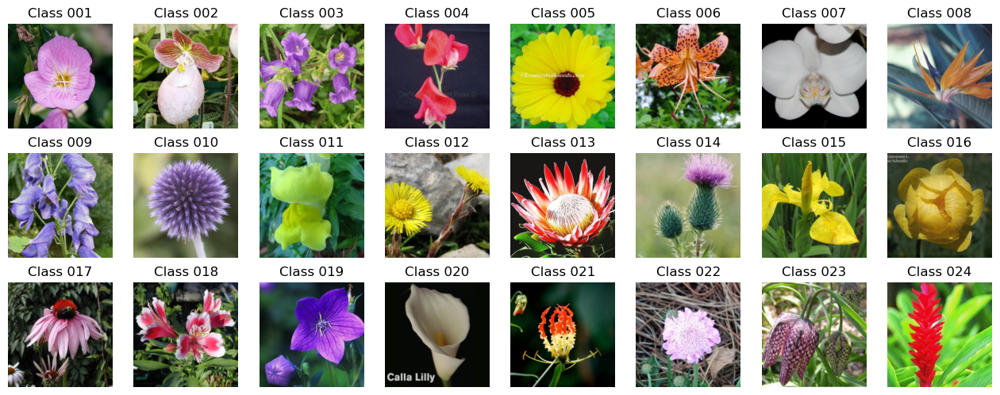

In [21]:
show_samples(dataset_train)

The generated train dataset will be used to fine tunning the networks of our Task 2 and in the ranking of most similar images (after calculate its embeddings with each model).

The validation dataset will be also used in the fine tunning of the Task 2 networks, in order to validate the training. It also will be used in the comparison of images as the reference set.

Finally, the test dataset will be used to get the real accuracy of the 3 networks and also some selected images will be used in the comparison of images and ranking of most similar images.

## Task1: Visual search from pretrained CNN

In this section we execute the first part of the assignment using a pretrained CNN. In this case, we selected the ResNet18 as it is trained with the imageNet dataset but it does not have a very complex structure compared to other models, so the time of retrained and execution is not very high. Other possible pretrained models could by DenseNet, Inception, VGG and even other variants of ResNet like ResNet50.

#### Load model

In [22]:
# Load the pretrained ResNet18 from pytorch
model = models.resnet18(pretrained=True)

c:\Users\marce\miniconda3\envs\cv2\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\marce\miniconda3\envs\cv2\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [23]:
# Show the architecture of the pre trained model
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

The last fully connected layer of a CNN can represent an embedding of the input image, so in the next cell we remove the classification layer to access this information.

In [24]:
# Remove last layer from model so we use embeddings instead of classification
model = nn.Sequential(*list(model.children())[:-1])

# Set model to evaluation mode
model.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

#### Compute embeddings for query image and reference set

In the next cell we compute the embeddings of the query image and the validation dataset that we are going to use as references to test the model using the previously defined functions.

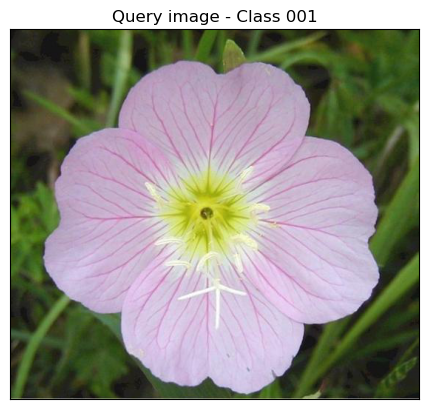

In [25]:
query_img = get_and_plot_query_image()

# We call the previously defined function that will return the embedding of the query image
query_emb = get_emb(query_img, model, transform)

# We call the previously defined function to obtain the reference embeddings
valid_loader = DataLoader(dataset_valid, batch_size=batch_size, shuffle=False, num_workers=4)
ref_emb = get_reference_set(model, valid_loader)

#### Compute similarity metric

Here we compute the similarity between the queried image and the list of images that we decide to took as reference. For this test we use the validation dataset as reference set in order to obtain its embeddings to compare against images in the test set. 

In [26]:
# Get the distance from the search image to each reference image
res = get_class_by_embedding(query_emb, ref_emb)

print(f"Most similar class to query image is class {res.classification}. Distance is {res.distance}")

Most similar class to query image is class 1. Distance is 0.3538571000099182


We can see that the classification correspond to the first class, the same one that the image belong to. The minimum distance is 0.35 in comparison to the closest image in the reference set.

#### Compare classes between images

In the next cells we compare images in order to evaluate the models identification. We execute 4 cases:
1. Two very similar images of the same class
2. Two very different images of the same class
3. Two very different images of different classes
4. Two very similar images of different classes

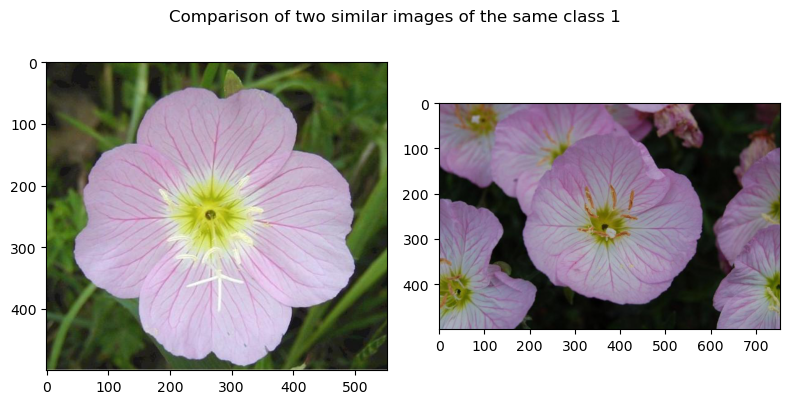

Both images correspond to the same class. Class 1


In [27]:
img_same_1, img_same_2 = get_and_plot_comparison_images(f'{dataPath}/test/001/image_06742.jpg'
                                                        ,f'{dataPath}/test/001/image_06769.jpg'
                                                        ,f"Comparison of two similar images of the same class 1")

emb_same_1 = get_emb(img_same_1, model, transform)
emb_same_2 = get_emb(img_same_2, model, transform)

compare_emb(emb_same_1, emb_same_2, ref_emb)

We can see that the model correctly classify the two images as class 1, stating that both correspond to the same class.

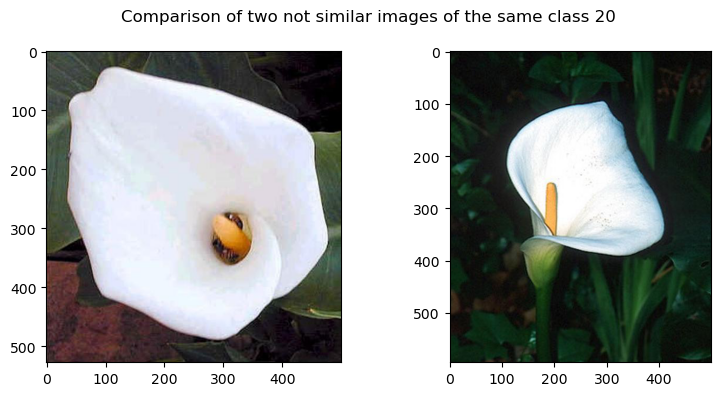

Both images correspond to the same class. Class 20


In [28]:
img_same_3, img_same_4 = get_and_plot_comparison_images(f'{dataPath}/test/020/image_04926.jpg',
                                                        f'{dataPath}/test/020/image_04929.jpg',
                                                        f"Comparison of two not similar images of the same class 20")

emb_same_3 = get_emb(img_same_3, model, transform)
emb_same_4 = get_emb(img_same_4, model, transform)

compare_emb(emb_same_3, emb_same_4, ref_emb)

We can see that the model correctly classify the two images as the same class, stating that they belong to class 20.

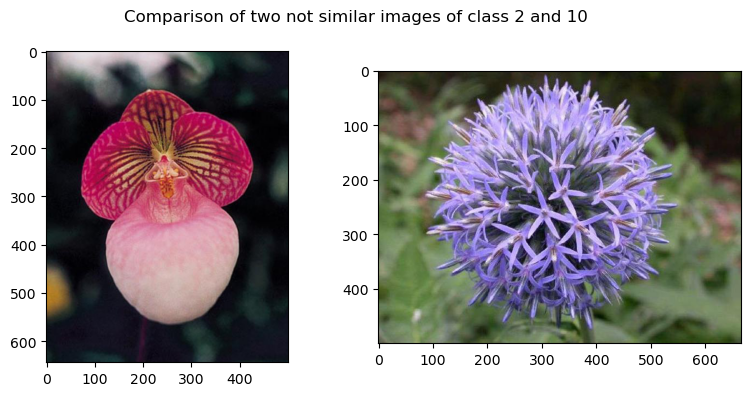

Images not correspond to the same class. First image correspond to 2 and second to 10


In [29]:
img_dif_1, img_dif_2 = get_and_plot_comparison_images(f'{dataPath}/test/002/image_05143.jpg',
                                                      f'{dataPath}/test/010/image_07109.jpg',
                                                      f"Comparison of two not similar images of class 2 and 10")

emb_dif_1 = get_emb(img_dif_1, model, transform)
emb_dif_2 = get_emb(img_dif_2, model, transform)

compare_emb(emb_dif_1, emb_dif_2, ref_emb)

We can see that the model correctly classify the two images as class 2 and class 10, stating that both correspond to different classes.

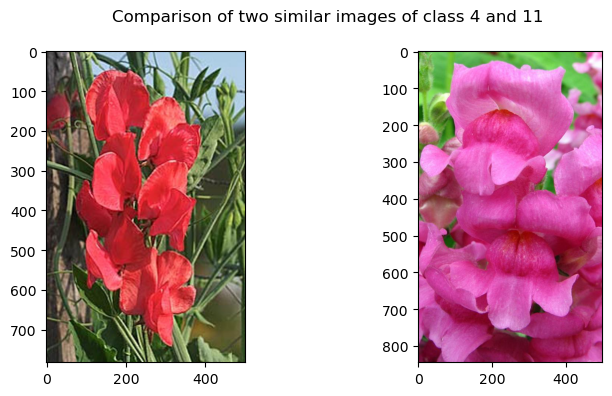

Both images correspond to the same class. Class 11


In [30]:
img_dif_3, img_dif_4 = get_and_plot_comparison_images(f'{dataPath}/test/004/image_05661.jpg',
                                                      f'{dataPath}/test/011/image_03126.jpg',
                                                      f"Comparison of two similar images of class 4 and 11")

emb_dif_3 = get_emb(img_dif_3, model, transform)
emb_dif_4 = get_emb(img_dif_4, model, transform)

compare_emb(emb_dif_3, emb_dif_4, ref_emb)

We can see that given the similarity in the two images the model incorrectly classify the two images as class 11, stating that both correspond to the same class when the first image should been classified as class 4. We will explore later more this case in order to obtain a better view on this result.

#### Rank the k most similar images

In this cells we show the most similar images to the ones used as query. We perform 5 searches, corresponding to class 2, class 5, class 8, class 10 and class 17.

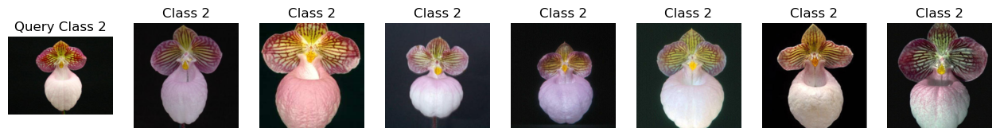

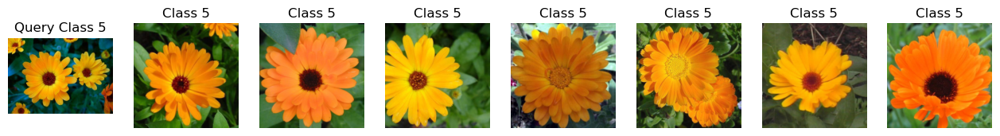

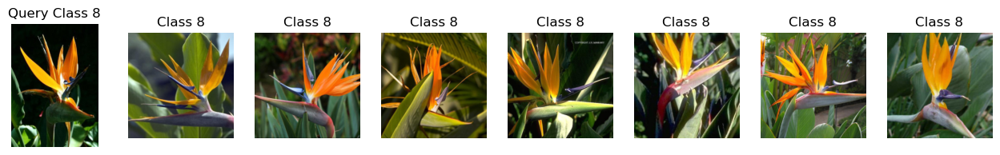

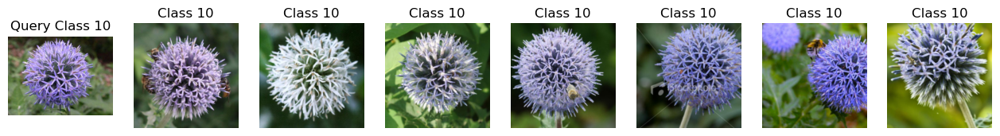

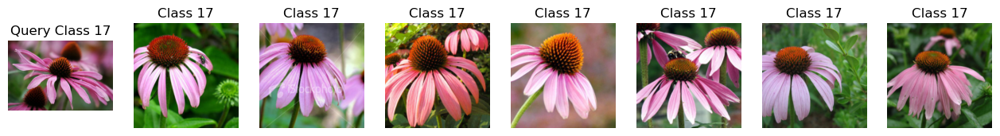

In [31]:
k = 7
train_loader = DataLoader(dataset_train, batch_size=batch_size, shuffle=False, num_workers=4)
search_images = get_query_images()

search_rank(search_images, model, transform, train_loader, k)

As we can see in the results, all images obtained correspond to the same class that the one used as query. 

Next, we run the ranking function in order to get more information about the comparison of similar images of different classes as it did not give good results.

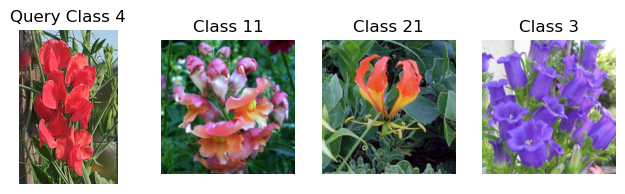

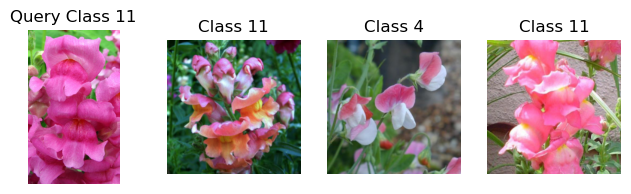

In [32]:
k = 3
val_loader = DataLoader(dataset_valid, batch_size=batch_size, shuffle=False, num_workers=4)

images = []
# Load query image
images.append(('4',Image.open(f'{dataPath}/test/004/image_05661.jpg')))
images.append(('11',Image.open(f'{dataPath}/test/011/image_03126.jpg')))

search_rank(images, model, transform, val_loader, k)

As we can see in the detail, not only the same image was used in order to arrive to the class 11 prediction for both images, but we can also see that classes 11 and 4 are very related to each other so its hard to the network to identify the difference between them. 

#### Compute performance metrics

Here we compute the real accuracy of the model based on the classification of the embedding with the test set. Also we decide to create a top-k accuracy function in order to see how the accuracy of the top 3 most similar images is.

Accuracy

In [33]:
test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=False, num_workers=4)

count = 0
correct = 0

### Specify the model that we are going to evaluate
model.eval()

### Iterate for all the batches
for i, (inputs, targets) in enumerate(test_loader):
    inputs, targets = inputs.to(device), targets.to(device)

    for x in range(len(inputs)):
        # Add a batch dimension to the tensors
        query_tensor = torch.unsqueeze(inputs[x], 0)

        # Extract features from images using ResNet model
        output = model(query_tensor)

        # Accumulate the number of processed samples
        count += 1

        # Flatten embeddings into a 2D tensor
        query_emb_fl = F.normalize(output.view(1, -1))

        closest_class = Classification(0,0)

        for obj_emb in ref_emb:
            ref_emb_fl = F.normalize(obj_emb.emb.view(len(obj_emb.emb), -1))

            # Compute pairwise distances between query and reference embeddings using Euclidean distance
            distance = F.pairwise_distance(query_emb_fl, ref_emb_fl, p=2).item()

            res = Classification(obj_emb.classification, distance)

            if (closest_class.distance > distance or closest_class.distance==0):
                closest_class = Classification(obj_emb.classification, distance)

        if (closest_class.classification==targets[x]):
            correct += 1

print("Accuracy:", correct / count)

Accuracy: 0.7678571428571429


Top-K accuracy (accuracy measure for the first 3 images in order to obtain how close of the correct classification does the model behave)

In [34]:
test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=False, num_workers=4)

count = 0
correct = 0
k = 3

### Specify the model that we are going to evaluate
model.eval()

### Iterate for all the batches
for i, (inputs, targets) in enumerate(test_loader):
    inputs, targets = inputs.to(device), targets.to(device)

    for x in range(len(inputs)):
        # Add a batch dimension to the tensors
        query_tensor = torch.unsqueeze(inputs[x], 0)

        # Extract features from images using ResNet model
        output = model(query_tensor)

        # Accumulate the number of processed samples
        count += 1

        # Flatten embeddings into a 2D tensor
        query_emb_fl = F.normalize(output.view(1, -1))

        results = []

        for obj_emb in ref_emb:
            ref_emb_fl = F.normalize(obj_emb.emb.view(len(obj_emb.emb), -1))

            # Compute pairwise distances between query and reference embeddings using Euclidean distance
            distance = F.pairwise_distance(query_emb_fl, ref_emb_fl, p=2).item()

            results.append(Classification(obj_emb.classification, distance))

        sorted_list = sorted(results, key=lambda x: x.distance)

        for item in sorted_list[:k]:
            if (item.classification==targets[x]):
                correct += 1
                break

print(f"Top {k} Accuracy: { correct / count }")

Top 3 Accuracy: 0.875


#### Model summary

Overall the pretrained CNN give correct results. It correctly classify the two most simple comparison images and one of the more complex ones and miss classified the other. As for the most similar classes, it properly show the most similar seven images corresponding to the closest embeddings of the queried image. 

Regarding for the model real accuracy, it has a value of 76.78% and a top 3 accuracy of 87.5%.

## Task2: Learning an embedding

In this section instead of using the pretrained model with the default weights, we do a fine tunning of the last layers. We divided this execution in two sections, first retraining the last layers with a regular cross entropy function and evaluate its results and then retraining this last model with a triplet loss function and mining the hard positives and hard negatives in order to make the model more robust.

### First model

In this model we retrain the last layers of the resnet18 with the train dataset using a cross-entropy loss function to see how the model will behave using our particular images to train.

#### Load and train model

In [35]:
# Load the pretrained ResNet18 but this time to train it from scratch
model = models.resnet18(pretrained=True)

In [36]:
print("Previous classification layer:", model.fc)

# Freeze all the parameters (in order to make them untrainable)
for param in model.parameters():
    param.requires_grad = False

# Unfreeze the last block (in order to make it trainable)
for param in model.layer4.parameters():
    param.requires_grad = True

# Replace the classification layer with one specifically for our problem
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)

print("Current classification layer:", model.fc)

Previous classification layer: Linear(in_features=512, out_features=1000, bias=True)
Current classification layer: Linear(in_features=512, out_features=24, bias=True)


In [37]:
model.to(device)
optimizer=Adam(model.parameters(), lr=0.0001)
batch_size=64
num_epochs = 100

f_loss = nn.CrossEntropyLoss()

train_loss, val_loss, train_acc, val_acc = train_model(model, dataset_train, dataset_valid, device, optimizer, f_loss, batch_size,num_epochs)

Epoch 1 Train loss: 3.5017448370975384 Train acc: 0.018674136321195144 Val loss: 2.6099926383407026 Val acc: 0.2962962962962963
Saving model. New loss: 2.6099926383407026
Epoch 2 Train loss: 2.2384416772092646 Train acc: 0.446311858076564 Val loss: 1.812720231656675 Val acc: 0.5333333333333333
Saving model. New loss: 1.812720231656675
Epoch 3 Train loss: 1.6521889526748301 Train acc: 0.7292250233426704 Val loss: 1.3182895907649288 Val acc: 0.7481481481481481
Saving model. New loss: 1.3182895907649288
Epoch 4 Train loss: 1.2438819314919265 Train acc: 0.911297852474323 Val loss: 1.0497307106300637 Val acc: 0.7925925925925926
Saving model. New loss: 1.0497307106300637
Epoch 5 Train loss: 0.9380281927650159 Train acc: 0.9841269841269841 Val loss: 0.9076876763944273 Val acc: 0.8296296296296296
Saving model. New loss: 0.9076876763944273
Epoch 6 Train loss: 0.7088795509658942 Train acc: 0.9981325863678805 Val loss: 0.81853346824646 Val acc: 0.8518518518518519
Saving model. New loss: 0.8185334

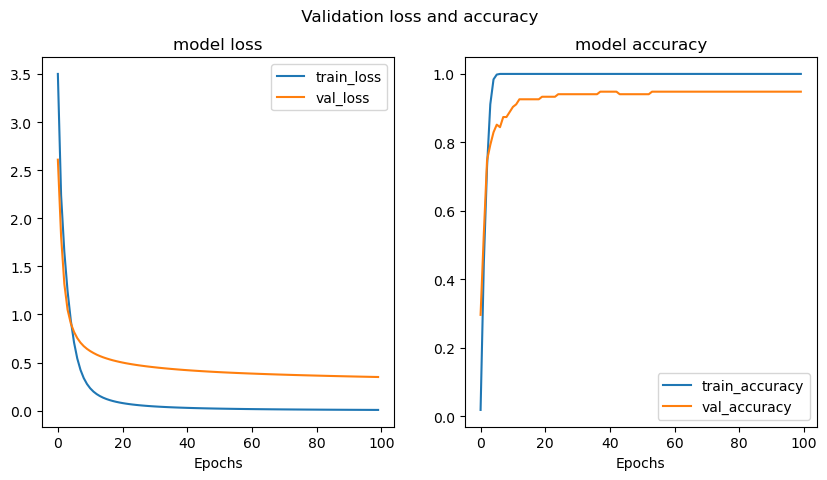

In [38]:
plot_loss_acc(train_loss, val_loss,train_acc, val_acc)

In [39]:
### Reload the model with the best parameters
model = torch.load('trained-model.pt', map_location=device)
model.to(device)

# Remove last layer from model so we use embeddings instead of classification
model = nn.Sequential(*list(model.children())[:-1])

# Set model to evaluation mode
model.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

#### Compute embeddings for query image and reference set

In the next cell we compute the embeddings of the images that we are going to use as references to test the model using the previously defined functions.

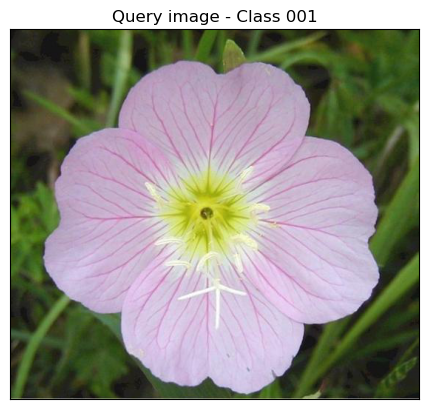

In [40]:
query_img = get_and_plot_query_image()

# We call the previously defined function that will return the embedding of the query image
query_emb = get_emb(query_img, model, transform)

# We call the previously defined function to obtain the reference embeddings
valid_loader = DataLoader(dataset_valid, batch_size=batch_size, shuffle=False, num_workers=4)
ref_emb = get_reference_set(model, valid_loader)

#### Compute similarity metric

Here we compute the similarity between the queried image and the list of images that we decide to took as reference

In [41]:
# Get the distance from the search image to each reference image to classify
res = get_class_by_embedding(query_emb, ref_emb)

print(f"Most similar class to query image is class {res.classification}. Distance is {res.distance}")

Most similar class to query image is class 1. Distance is 0.41936805844306946


We can see that the minimum distance is for the first class, the same type that the image we take for test and the one that the model will classified if we have not removed the classification layer.

#### Compare classes between images

In the next cells we compare images in order to evaluate the models identification. We execute 4 cases:
1. Two very similar images of the same class
2. Two very different images of the same class
3. Two very different images of different classes
4. Two very similar images of different classes

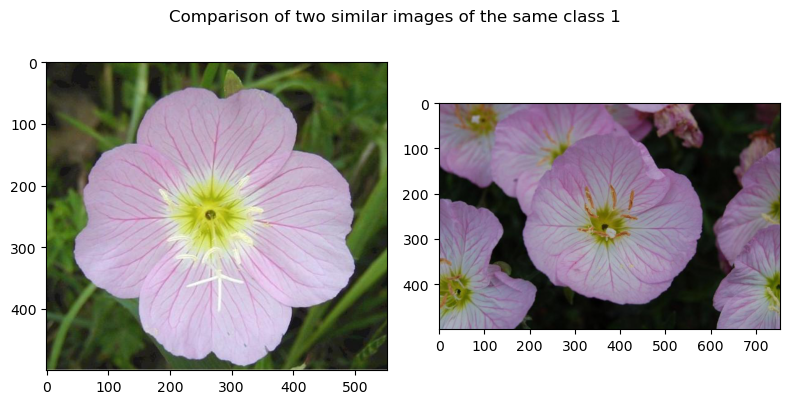

Both images correspond to the same class. Class 1


In [42]:
img_same_1, img_same_2 = get_and_plot_comparison_images(f'{dataPath}/test/001/image_06742.jpg'
                                                        ,f'{dataPath}/test/001/image_06769.jpg'
                                                        ,f"Comparison of two similar images of the same class 1")

emb_same_1 = get_emb(img_same_1, model, transform)
emb_same_2 = get_emb(img_same_2, model, transform)

compare_emb(emb_same_1, emb_same_2, ref_emb)

We can see that the model correctly classify the two images as class 01, stating that both correspond to the same class.

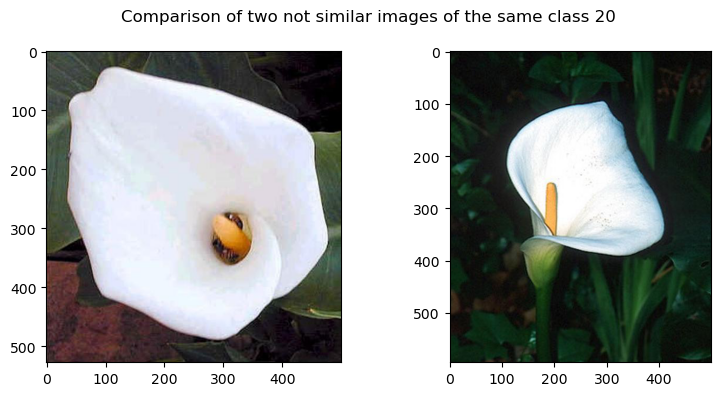

Both images correspond to the same class. Class 20


In [43]:
img_same_3, img_same_4 = get_and_plot_comparison_images(f'{dataPath}/test/020/image_04926.jpg',
                                                        f'{dataPath}/test/020/image_04929.jpg',
                                                        f"Comparison of two not similar images of the same class 20")

emb_same_3 = get_emb(img_same_3, model, transform)
emb_same_4 = get_emb(img_same_4, model, transform)

compare_emb(emb_same_3, emb_same_4, ref_emb)

We can see that the model correctly classify the two images as the same classes.

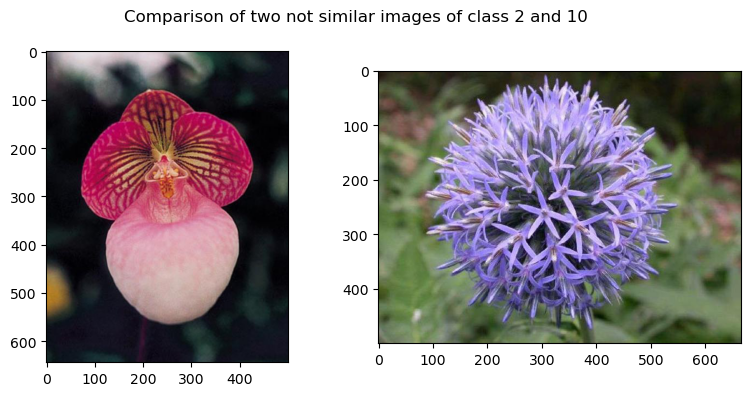

Images not correspond to the same class. First image correspond to 2 and second to 10


In [44]:
img_dif_1, img_dif_2 = get_and_plot_comparison_images(f'{dataPath}/test/002/image_05143.jpg',
                                                      f'{dataPath}/test/010/image_07109.jpg',
                                                      f"Comparison of two not similar images of class 2 and 10")

emb_dif_1 = get_emb(img_dif_1, model, transform)
emb_dif_2 = get_emb(img_dif_2, model, transform)

compare_emb(emb_dif_1, emb_dif_2, ref_emb)

We can see that the model correctly classify the two images as class 2 and class 10, stating that both correspond to different classes.

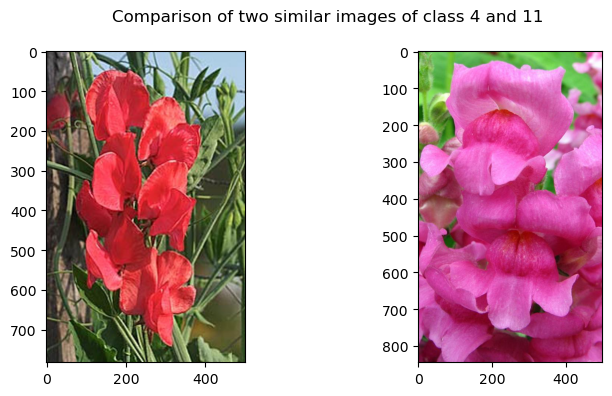

Images not correspond to the same class. First image correspond to 18 and second to 11


In [45]:
img_dif_3, img_dif_4 = get_and_plot_comparison_images(f'{dataPath}/test/004/image_05661.jpg',
                                                      f'{dataPath}/test/011/image_03126.jpg',
                                                      f"Comparison of two similar images of class 4 and 11")

emb_dif_3 = get_emb(img_dif_3, model, transform)
emb_dif_4 = get_emb(img_dif_4, model, transform)

compare_emb(emb_dif_3, emb_dif_4, ref_emb)

We can see that this time, the model correctly detect two different classes, but incorrectly classify the first image as class 18 instead of class 4. We will explore later more this case in order to obtain a better view on this result.

#### Rank the k most similar images

In this cells we show the most similar images to the ones used as query. We perform 5 searches, corresponding to class 2, class 5, class 8, class 10 and class 17.

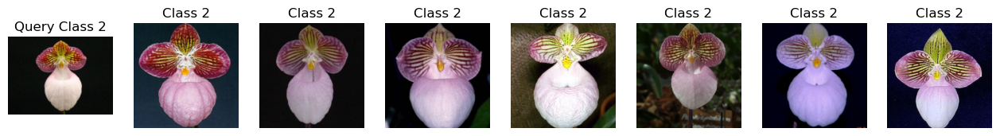

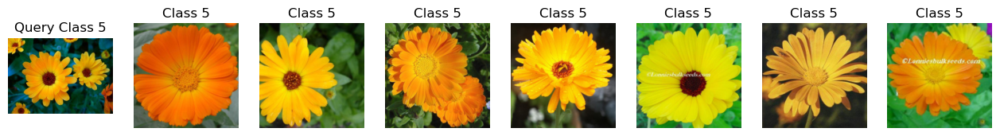

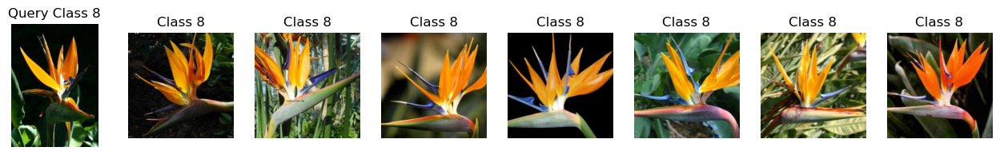

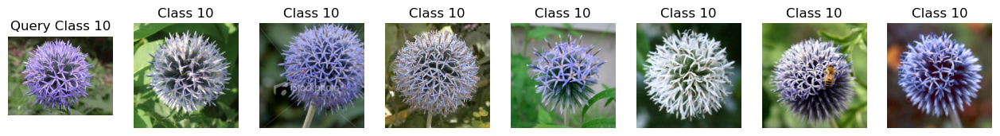

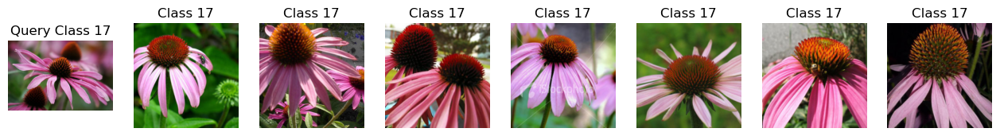

In [46]:
k = 7
train_loader = DataLoader(dataset_train, batch_size=batch_size, shuffle=False, num_workers=4)
search_images = get_query_images()

search_rank(search_images, model, transform, train_loader, k)

As we can see in the results, all images obtained correspond to the same class that the one used as query. 

Next, we run the ranking function in order to get more information about the comparison of similar images of different classes.

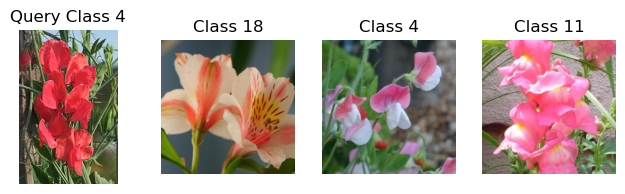

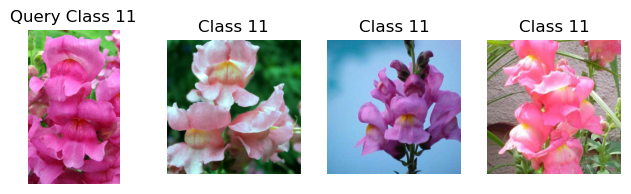

In [47]:
k = 3
val_loader = DataLoader(dataset_valid, batch_size=batch_size, shuffle=False, num_workers=4)

images = []
# Load query image
images.append(('4',Image.open(f'{dataPath}/test/004/image_05661.jpg')))
images.append(('11',Image.open(f'{dataPath}/test/011/image_03126.jpg')))

search_rank(images, model, transform, val_loader, k)

As we can see in the detail, the second image is correctly classify as class 11 in the three most closest images (previous pretrained model classify one as class 4). As for the first image, this time we can see that its classified as class 18 (in the previous model was classified as 11) but the second closest image does correspond to a correct class 4, showing that it was closer to correctly classify the resulting embedding.

#### Compute performance metrics

Here we compute the real accuracy of the model based on the classification of the embedding with the test set. Also we decide to create a top-k accuracy function in order to see how the accuracy of the top 3 most similar images is.

Accuracy

In [48]:
test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=False, num_workers=4)

count = 0
correct = 0

### Specify the model that we are going to evaluate
model.eval()

### Iterate for all the batches
for i, (inputs, targets) in enumerate(test_loader):
    inputs, targets = inputs.to(device), targets.to(device)

    for x in range(len(inputs)):
        # Add a batch dimension to the tensors
        query_tensor = torch.unsqueeze(inputs[x], 0)

        # Extract features from images using ResNet model
        output = model(query_tensor)

        # Accumulate the number of processed samples
        count += 1

        # Flatten embeddings into a 2D tensor
        query_emb_fl = F.normalize(output.view(1, -1))

        closest_class = Classification(0,0)

        for obj_emb in ref_emb:
            ref_emb_fl = F.normalize(obj_emb.emb.view(len(obj_emb.emb), -1))

            # Compute pairwise distances between query and reference embeddings using Euclidean distance
            distance = F.pairwise_distance(query_emb_fl, ref_emb_fl, p=2).item()

            res = Classification(obj_emb.classification, distance)

            if (closest_class.distance > distance or closest_class.distance==0):
                closest_class = Classification(obj_emb.classification, distance)

        if (closest_class.classification==targets[x]):
            correct += 1

print("Accuracy:", correct / count)

Accuracy: 0.9642857142857143


Top-K accuracy (accuracy measure for the first 3 images in order to obtain how close of the correct classification does the model behave)

In [49]:
test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=False, num_workers=4)

count = 0
correct = 0
k = 3

### Specify the model that we are going to evaluate
model.eval()

### Iterate for all the batches
for i, (inputs, targets) in enumerate(test_loader):
    inputs, targets = inputs.to(device), targets.to(device)

    for x in range(len(inputs)):
        # Add a batch dimension to the tensors
        query_tensor = torch.unsqueeze(inputs[x], 0)

        # Extract features from images using ResNet model
        output = model(query_tensor)

        # Accumulate the number of processed samples
        count += 1

        # Flatten embeddings into a 2D tensor
        query_emb_fl = F.normalize(output.view(1, -1))

        results = []

        for obj_emb in ref_emb:
            ref_emb_fl = F.normalize(obj_emb.emb.view(len(obj_emb.emb), -1))

            # Compute pairwise distances between query and reference embeddings using Euclidean distance
            distance = F.pairwise_distance(query_emb_fl, ref_emb_fl, p=2).item()

            results.append(Classification(obj_emb.classification, distance))

        sorted_list = sorted(results, key=lambda x: x.distance)

        for item in sorted_list[:k]:
            if (item.classification==targets[x]):
                correct += 1
                break

print(f"Top {k} Accuracy: { correct / count }")

Top 3 Accuracy: 0.9821428571428571


#### Model summary

Overall the pretrained CNN fine tuned with our dataset give very good results. It correctly classify the two most simple comparison images and one of the most complex ones, only classifying incorrectly one of the last images. As for the most similar classes, it properly show the most similar seven images corresponding to the closest embeddings of the queried image. 

Regarding the model accuracy, it has a validation accuracy of 94.81% in training and a real accuracy of 96.42% for the test set with a top 3 accuracy of 98.21%.

### Second Model 

In this model, we retrain the previous best model but using mined images and triplet loss ir order to make it more robust.

#### Load and train model

First we reload the best previous trained model to train it again using the triple loss function and mining the hard positives and hard negatives of the images.

In [50]:
### Reload the model with the best parameters
model = torch.load('trained-model.pt', map_location=device)
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [51]:
# Define the triple loss and triple miner functions. 

# We use cosine similarity as distance measure (product of the vectors divided by the product of their lengths).
# In theory is the best measure for determining the distance between neighbors
distance = distances.CosineSimilarity()
# We define the triple margin loss function
loss_fn = losses.TripletMarginLoss(margin=0.2, distance=distance)
# We define the triple margin miner, using semi hard as parameter in order to obtain the hard positives and hard negatives
miner = miners.TripletMarginMiner(margin=0.2, distance=distance, type_of_triplets="semihard")

optimizer=Adam(model.parameters(), lr=0.001)
batch_size=64
num_epochs = 100

# Train the model
train_loss, val_loss, train_acc, val_acc = train_model_triplet(model, dataset_train, dataset_valid, device,
                optimizer, 
                loss_fn,
                miner,
                batch_size=batch_size, 
                num_epochs=num_epochs,
                output_filename='trained-model-triplet.pt')

Epoch 1 Train loss: 0.07201216917356301 Train acc: 0.9477124183006536 Val loss: 0.08279348655983254 Val acc: 0.8814814814814815
Saving model. New loss: 0.08279348655983254
Epoch 2 Train loss: 0.07783489574153885 Train acc: 0.9365079365079365 Val loss: 0.0754346282393844 Val acc: 0.8296296296296296
Saving model. New loss: 0.0754346282393844
Epoch 3 Train loss: 0.07183529956250631 Train acc: 0.9094304388422035 Val loss: 0.07889447035612883 Val acc: 0.8074074074074075
Epoch 4 Train loss: 0.05894801067927527 Train acc: 0.9169000933706816 Val loss: 0.07736019205164027 Val acc: 0.7851851851851852
Epoch 5 Train loss: 0.0726936288198837 Train acc: 0.8898225957049486 Val loss: 0.07696400041933413 Val acc: 0.7777777777777778
Epoch 6 Train loss: 0.05769251767340717 Train acc: 0.9131652661064426 Val loss: 0.07306280842533817 Val acc: 0.8814814814814815
Saving model. New loss: 0.07306280842533817
Epoch 7 Train loss: 0.059024890894322446 Train acc: 0.9028944911297853 Val loss: 0.06887723251625344 Va

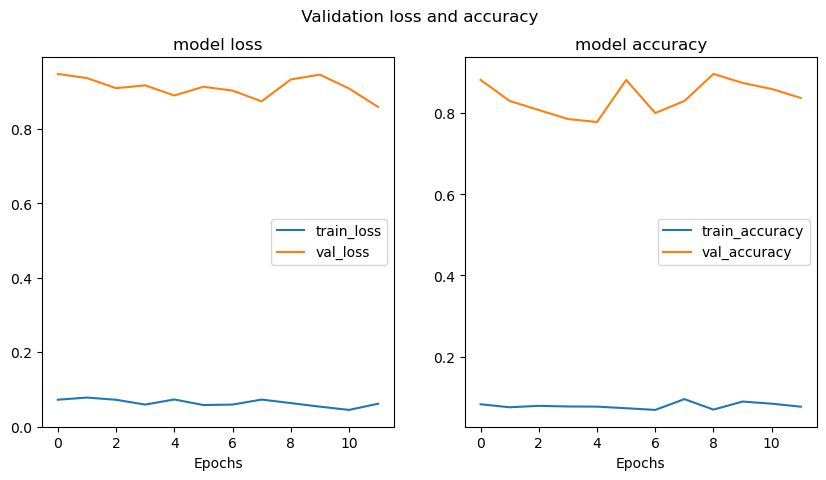

In [52]:
plot_loss_acc(train_loss, val_loss,train_acc, val_acc)

We can observe in the previous plot that the model reaches overfitting in very few epochs, as is actually continuing with the training done in the previous model but this time using the triplet loss function with the mined hard positives and hard negatives.


In [53]:
### Reload the model with the best parameters
model = torch.load('trained-model-triplet.pt', map_location=device)
model.to(device)

# Remove last layer from model so we use embeddings instead of classification
model = nn.Sequential(*list(model.children())[:-1])

# Set model to evaluation mode
model.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

#### Compute embeddings for query image and reference set

In the next to cells we compute the embeddings of the images that we are going to use as references to test the model using the previously defined functions.

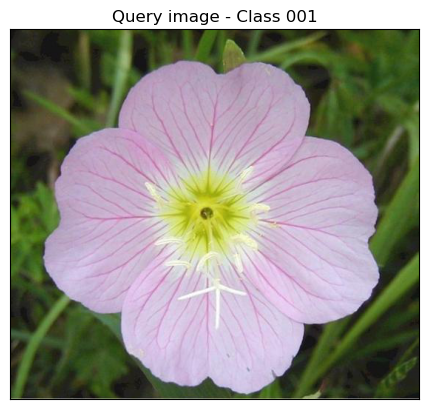

In [54]:
query_img = get_and_plot_query_image()

# We call the previously defined function that will return the embedding of the query image
query_emb = get_emb(query_img, model, transform)

# We call the previously defined function to obtain the reference embeddings
valid_loader = DataLoader(dataset_valid, batch_size=batch_size, shuffle=False, num_workers=4)
ref_emb = get_reference_set(model, valid_loader)

#### Compute similarity metric

Here we compute the similarity between the queried image and the list of images that we decide to took as reference

In [56]:
# Get the distance from the search image to each reference image
res = get_class_by_embedding(query_emb, ref_emb)

print(f"Most similar class to query image is class {res.classification}: {res.distance}")

Most similar class to query image is class 1: 0.17872871458530426


We can see that the minimum distance is for the first class, the same type that the image we take for test and the one that the model will classified if we have not removed the classification layer. In this case the distance to the correct image is reduced compared to previous models.

#### Compare classes between images

In the next cells we compare images in order to evaluate the models identification. We execute 4 cases:
1. Two very similar images of the same class
2. Two very different images of the same class
3. Two very different images of different classes
4. Two very similar images of different classes

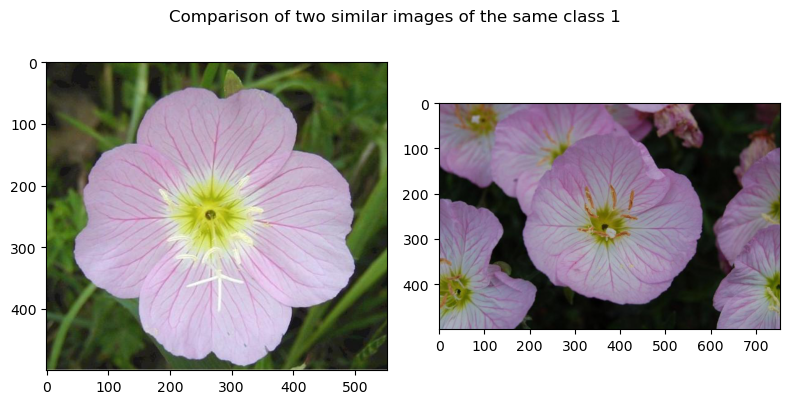

Both images correspond to the same class. Class 1


In [57]:
img_same_1, img_same_2 = get_and_plot_comparison_images(f'{dataPath}/test/001/image_06742.jpg'
                                                        ,f'{dataPath}/test/001/image_06769.jpg'
                                                        ,f"Comparison of two similar images of the same class 1")

emb_same_1 = get_emb(img_same_1, model, transform)
emb_same_2 = get_emb(img_same_2, model, transform)

compare_emb(emb_same_1, emb_same_2, ref_emb)

We can see that the model correctly classify the two images as class 01, stating that both correspond to the same class.

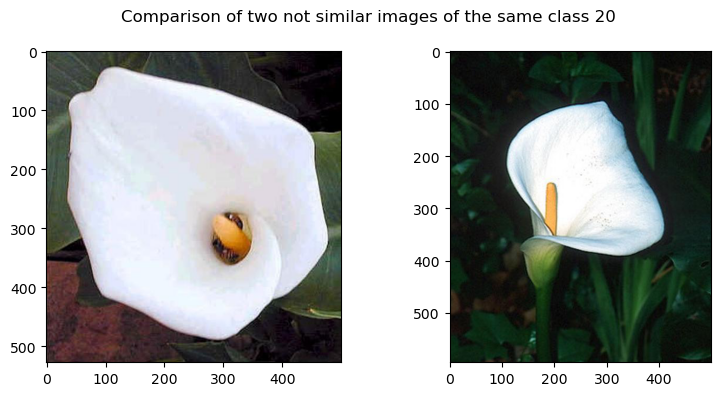

Both images correspond to the same class. Class 20


In [58]:
img_same_3, img_same_4 = get_and_plot_comparison_images(f'{dataPath}/test/020/image_04926.jpg',
                                                        f'{dataPath}/test/020/image_04929.jpg',
                                                        f"Comparison of two not similar images of the same class 20")

emb_same_3 = get_emb(img_same_3, model, transform)
emb_same_4 = get_emb(img_same_4, model, transform)

compare_emb(emb_same_3, emb_same_4, ref_emb)

We can see that this model also correctly classify the two images as the same classes.

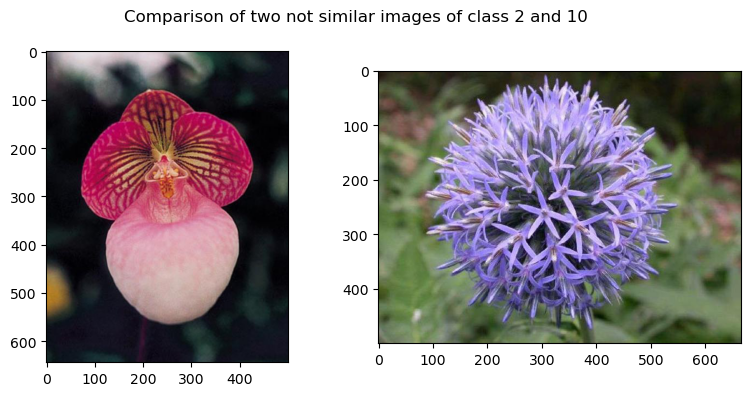

Images not correspond to the same class. First image correspond to 2 and second to 10


In [59]:
img_dif_1, img_dif_2 = get_and_plot_comparison_images(f'{dataPath}/test/002/image_05143.jpg',
                                                      f'{dataPath}/test/010/image_07109.jpg',
                                                      f"Comparison of two not similar images of class 2 and 10")

emb_dif_1 = get_emb(img_dif_1, model, transform)
emb_dif_2 = get_emb(img_dif_2, model, transform)

compare_emb(emb_dif_1, emb_dif_2, ref_emb)

We can see that the model correctly classify the two images as class 2 and class 10, stating that both correspond to different classes.

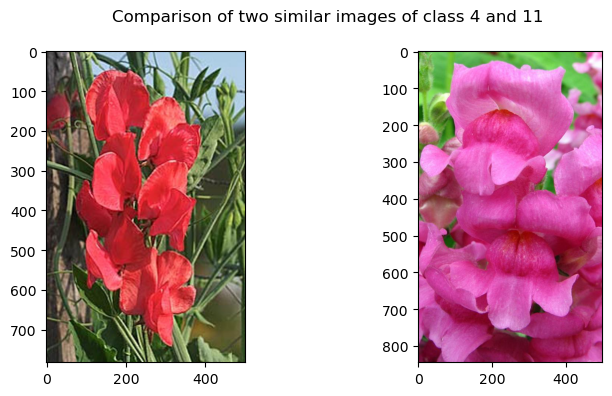

Images not correspond to the same class. First image correspond to 4 and second to 11


In [60]:
img_dif_3, img_dif_4 = get_and_plot_comparison_images(f'{dataPath}/test/004/image_05661.jpg',
                                                      f'{dataPath}/test/011/image_03126.jpg',
                                                      f"Comparison of two similar images of class 4 and 11")

emb_dif_3 = get_emb(img_dif_3, model, transform)
emb_dif_4 = get_emb(img_dif_4, model, transform)

compare_emb(emb_dif_3, emb_dif_4, ref_emb)

We can see that the model this time correctly classify the two images as different with the correct classification. The previous two models (the pretrained and the fine tuned with our dataset) have fail in this classification. Later we will continue exploring this case.

#### Rank the k most similar images

In this cells we show the most similar images to the ones used as query. We perform 5 searches, corresponding to class 2, class 5, class 8, class 10 and class 17.

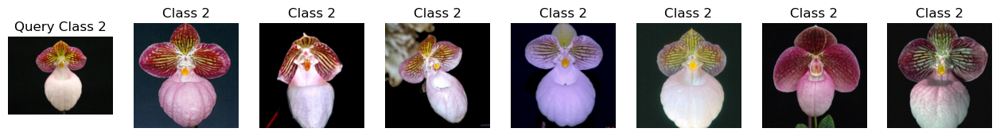

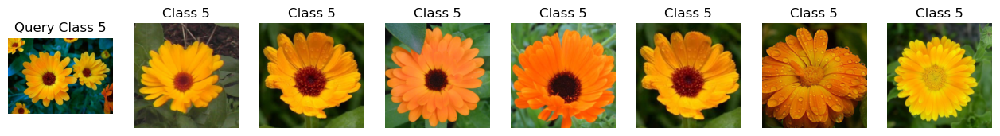

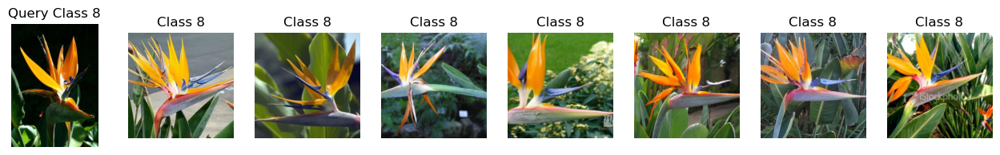

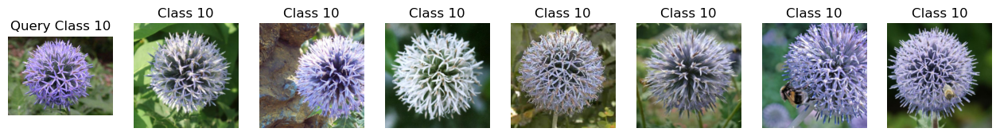

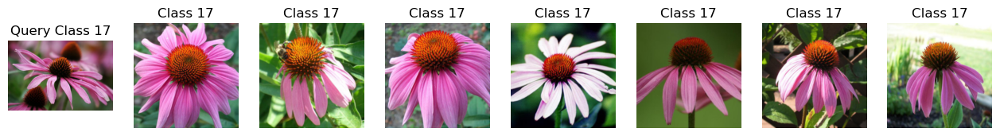

In [61]:
k = 7
train_loader = DataLoader(dataset_train, batch_size=batch_size, shuffle=False, num_workers=4)
search_images = get_query_images()

search_rank(search_images, model, transform, train_loader, k)

As we can see in the results, all images obtained correspond to the same class that the one used as query. 

Next, we run the ranking function in order to get more information about the comparison of similar images of different classes to compare with the previous models, as this time they where correctly classified.

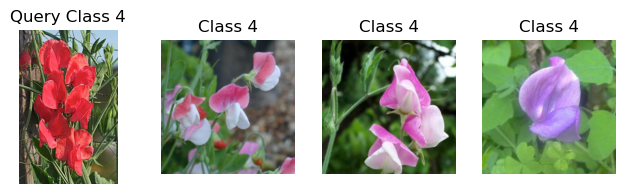

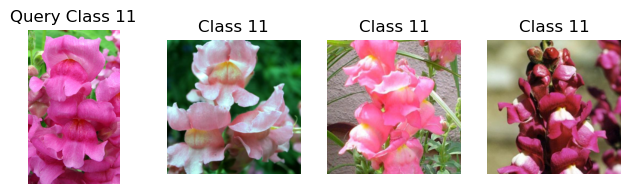

In [62]:
k = 3
val_loader = DataLoader(dataset_valid, batch_size=batch_size, shuffle=False, num_workers=4)

images = []
# Load query image
images.append(('4',Image.open(f'{dataPath}/test/004/image_05661.jpg')))
images.append(('11',Image.open(f'{dataPath}/test/011/image_03126.jpg')))

search_rank(images, model, transform, val_loader, k)

As we can see in the detail, the three most closest images to both the images correspond to the correct class. The hard positive and hard negative training give the model a more efficient way of distancing/grouping the embedding of the images.

#### Compute performance metrics

Here we compute the real accuracy of the model based on the classification of the embedding with the test set. Also we decide to create a top-k accuracy function in order to see how the accuracy of the top 3 most similar classes is.

Accuracy

In [63]:
test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=False, num_workers=4)

count = 0
correct = 0

### Specify the model that we are going to evaluate
model.eval()

### Iterate for all the batches
for i, (inputs, targets) in enumerate(test_loader):
    inputs, targets = inputs.to(device), targets.to(device)

    for x in range(len(inputs)):
        # Add a batch dimension to the tensors
        query_tensor = torch.unsqueeze(inputs[x], 0)

        # Extract features from images using ResNet model
        output = model(query_tensor)

        # Accumulate the number of processed samples
        count += 1

        # Flatten embeddings into a 2D tensor
        query_emb_fl = F.normalize(output.view(1, -1))

        closest_class = Classification(0,0)

        for obj_emb in ref_emb:
            ref_emb_fl = F.normalize(obj_emb.emb.view(len(obj_emb.emb), -1))

            # Compute pairwise distances between query and reference embeddings using Euclidean distance
            distance = F.pairwise_distance(query_emb_fl, ref_emb_fl, p=2).item()

            res = Classification(obj_emb.classification, distance)

            if (closest_class.distance > distance or closest_class.distance==0):
                closest_class = Classification(obj_emb.classification, distance)

        if (closest_class.classification==targets[x]):
            correct += 1

print("Accuracy:", correct / count)

Accuracy: 1.0


Top-K accuracy (accuracy measure for the first 3 images in order to obtain how close of the correct classification does the model behave)

In [64]:
test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=False, num_workers=4)

count = 0
correct = 0
k = 3

### Specify the model that we are going to evaluate
model.eval()

### Iterate for all the batches
for i, (inputs, targets) in enumerate(test_loader):
    inputs, targets = inputs.to(device), targets.to(device)

    for x in range(len(inputs)):
        # Add a batch dimension to the tensors
        query_tensor = torch.unsqueeze(inputs[x], 0)

        # Extract features from images using ResNet model
        output = model(query_tensor)

        # Accumulate the number of processed samples
        count += 1

        # Flatten embeddings into a 2D tensor
        query_emb_fl = F.normalize(output.view(1, -1))

        results = []

        for obj_emb in ref_emb:
            ref_emb_fl = F.normalize(obj_emb.emb.view(len(obj_emb.emb), -1))

            # Compute pairwise distances between query and reference embeddings using Euclidean distance
            distance = F.pairwise_distance(query_emb_fl, ref_emb_fl, p=2).item()

            results.append(Classification(obj_emb.classification, distance))

        sorted_list = sorted(results, key=lambda x: x.distance)

        for item in sorted_list[:k]:
            if (item.classification==targets[x]):
                correct += 1
                break

print(f"Top {k} Accuracy: { correct / count }")

Top 3 Accuracy: 1.0
